In [1]:
from pathlib import Path
from typing import Dict, List, Iterable
from qiskit import QuantumCircuit
from qiskit.transpiler.preset_passmanagers import generate_preset_pass_manager
from qiskit.transpiler import CouplingMap, PassManager
from IPython.display import display


def gather_qasm_files(paths: Iterable[str]) -> List[Path]:
    """Expand a list of files/dirs into a sorted list of .qasm files."""
    result: List[Path] = []
    for p in paths:
        path = Path(p)
        if path.is_dir():
            result.extend(sorted(path.glob("*.qasm")))
        elif path.is_file() and path.suffix.lower() == ".qasm":
            result.append(path)
        else:
            print(f"Skipping {p}: not a .qasm file or directory.")
    return sorted(set(result))

filepath = "circuits_iso/"
qasm_files = gather_qasm_files([filepath])
print(f"Found {len(qasm_files)} .qasm files in {filepath}")

Found 7 .qasm files in circuits_iso/


Visualizing cat_n65.qasm with 65 qubits and 130 gates


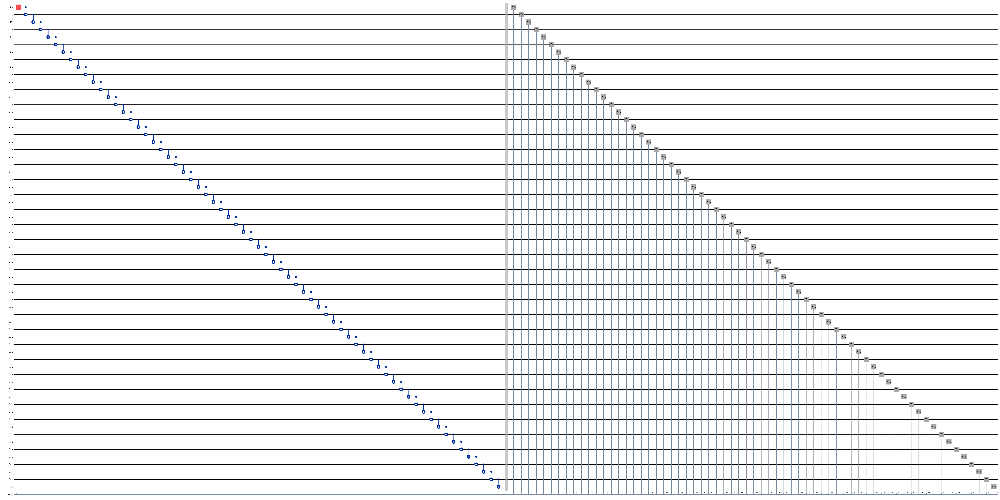

Visualizing dnn_n51.qasm with 51 qubits and 274 gates


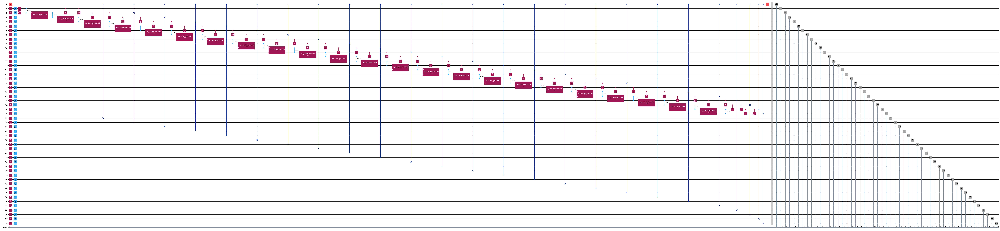

Visualizing ghz_n78.qasm with 78 qubits and 156 gates


Visualizing ising_n98.qasm with 98 qubits and 1170 gates


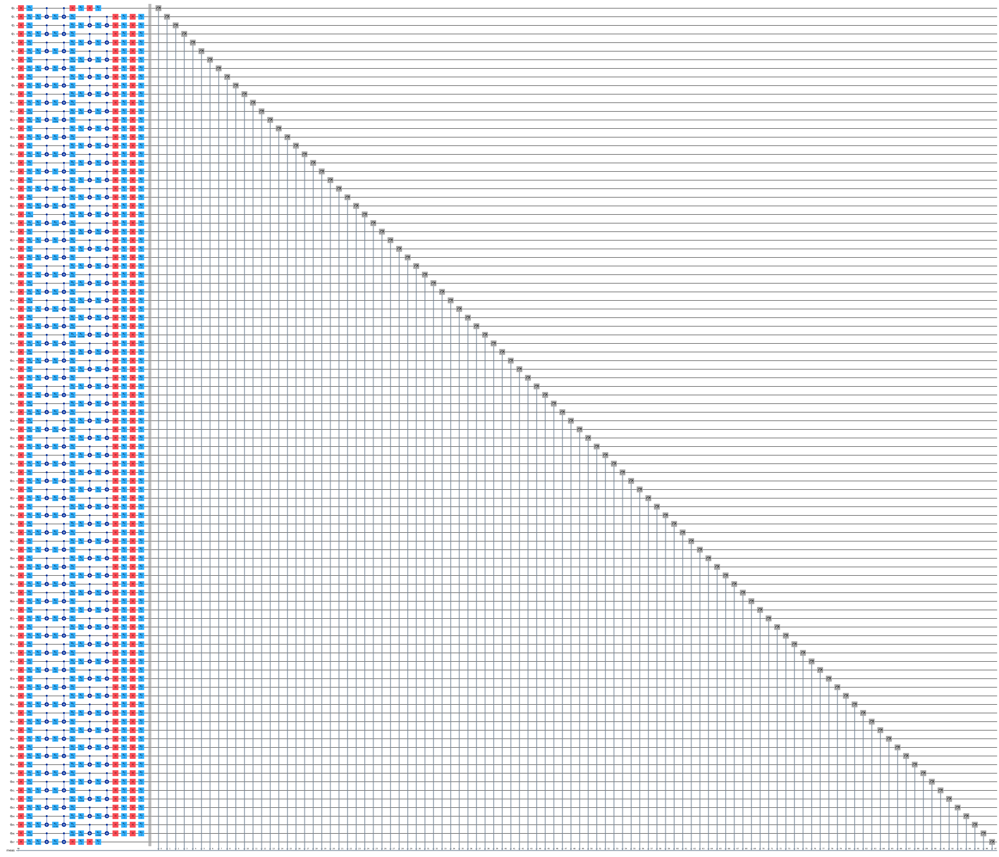

Visualizing knn_67.qasm with 67 qubits and 102 gates


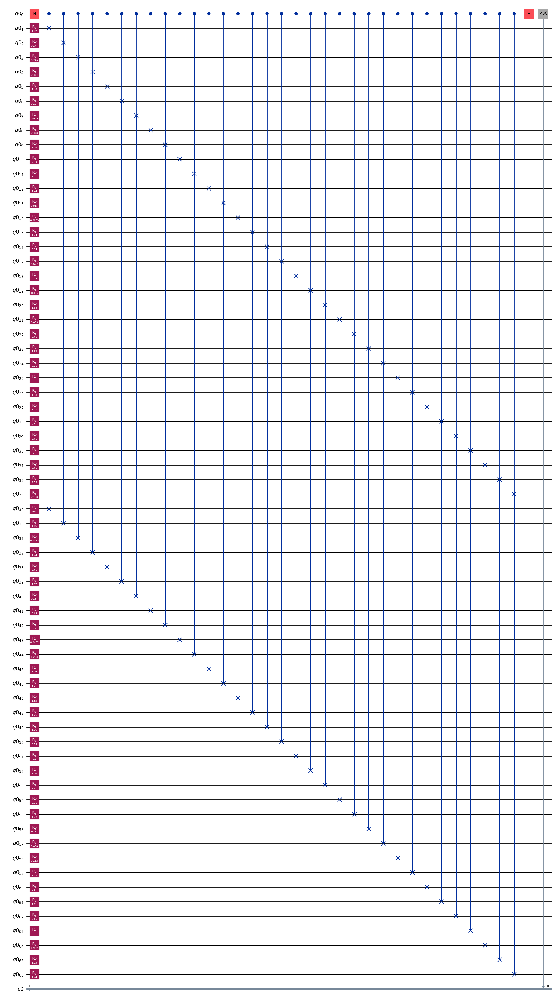

Visualizing multiplier_n45.qasm with 45 qubits and 698 gates


Visualizing swap_test_n83.qasm with 83 qubits and 126 gates


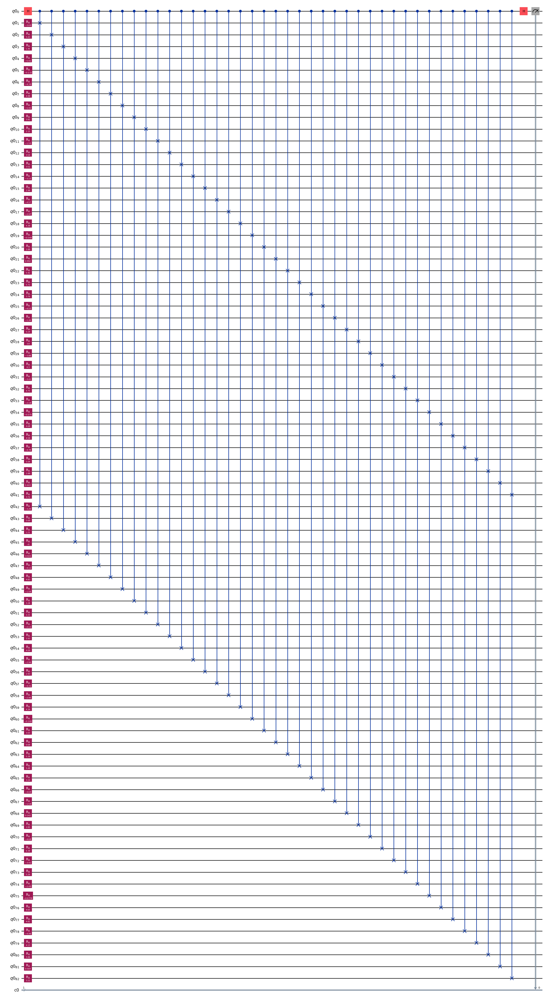

In [2]:
circuits_dict = {}
for q in qasm_files:
    circuit = QuantumCircuit.from_qasm_file(q)
    print(f"Visualizing {q.name} with {circuit.num_qubits} qubits and {circuit.size()} gates")
    display(circuit.draw('mpl', idle_wires=False, fold=-1))
    circuits_dict[q.name] = circuit


In [3]:
from qiskit_ibm_runtime.fake_provider.backends.sherbrooke import FakeSherbrooke
fake_backend = FakeSherbrooke()
coupling_map = fake_backend.coupling_map   
coupling_map.make_symmetric()

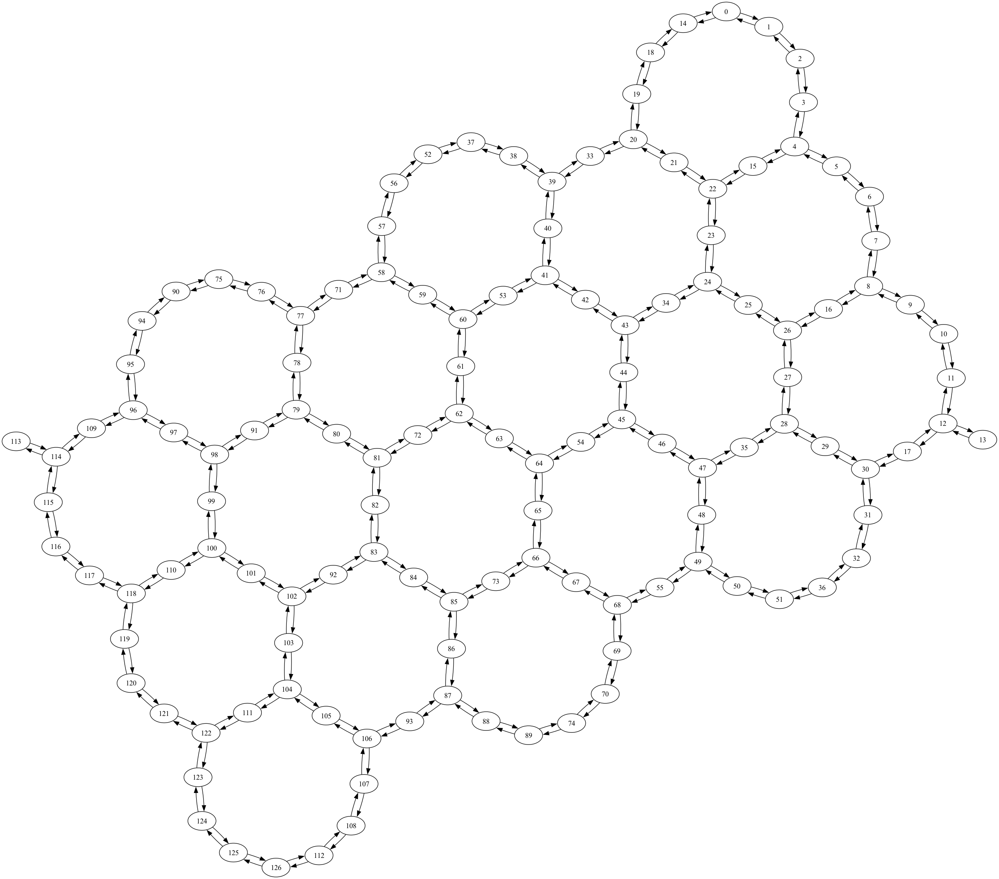

In [4]:
coupling_map.draw()

In [5]:
circuits_dict

{'cat_n65.qasm': <qiskit.circuit.quantumcircuit.QuantumCircuit at 0x119af4b10>,
 'dnn_n51.qasm': <qiskit.circuit.quantumcircuit.QuantumCircuit at 0x11b948290>,
 'ghz_n78.qasm': <qiskit.circuit.quantumcircuit.QuantumCircuit at 0x11c969ed0>,
 'ising_n98.qasm': <qiskit.circuit.quantumcircuit.QuantumCircuit at 0x11dac9b50>,
 'knn_67.qasm': <qiskit.circuit.quantumcircuit.QuantumCircuit at 0x138c58290>,
 'multiplier_n45.qasm': <qiskit.circuit.quantumcircuit.QuantumCircuit at 0x139beb450>,
 'swap_test_n83.qasm': <qiskit.circuit.quantumcircuit.QuantumCircuit at 0x14c225cd0>}

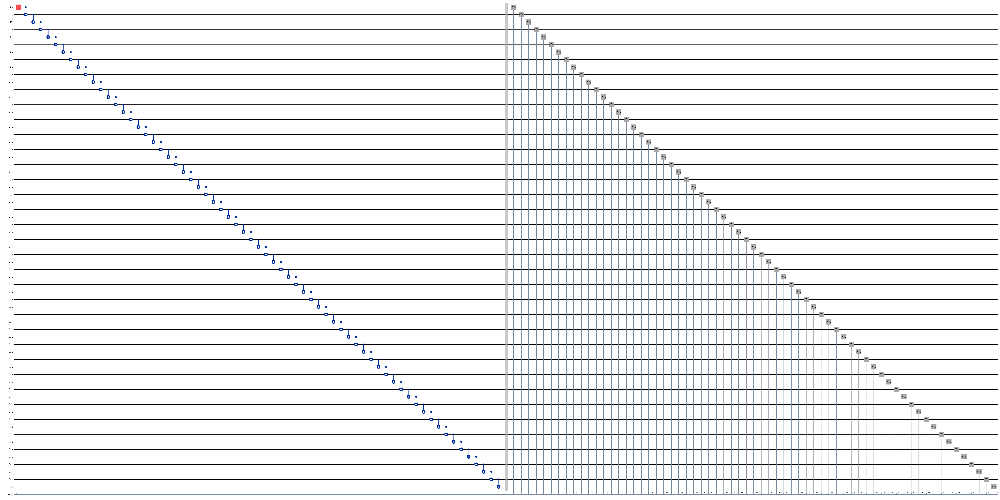

In [6]:
qc = circuits_dict['cat_n65.qasm']
display(qc.draw('mpl', idle_wires=False, fold=-1))

In [7]:
pm = generate_preset_pass_manager(coupling_map=coupling_map, optimization_level=2, seed_transpiler=42)
sabre_cir = pm.run(qc)


In [8]:
sabre_cir.count_ops()

OrderedDict([('measure', 65),
             ('cx', 64),
             ('swap', 14),
             ('h', 1),
             ('barrier', 1)])

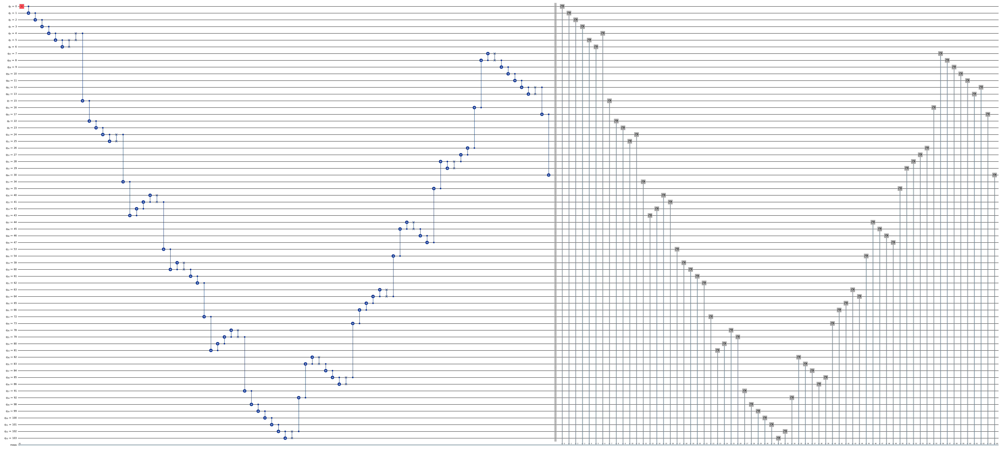

In [9]:
sabre_cir.draw('mpl', idle_wires=False, fold=-1)

In [10]:
from multilevel_sabre import MultiLevelSabre

In [11]:
multilevel_pass = PassManager([
    MultiLevelSabre(
        coupling_graph=coupling_map,
        cycles=10,
        random_seed=1,
        coarsest_solving_trials=50,
        num_interpolation=10,
        use_initial_embedding=True,
        verbose=0,
    )
])
multilevel_cir = multilevel_pass.run(qc)
multilevel_cir.count_ops()

Starting MultiLevel SABRE optimization...
seed: 1
Add idle qubits
Initial mapping quality: 0
Initial mapping: {0: 95, 1: 94, 2: 90, 3: 75, 4: 76, 5: 77, 6: 78, 7: 79, 8: 80, 9: 81, 10: 72, 11: 62, 12: 63, 13: 64, 14: 54, 15: 45, 16: 46, 17: 47, 18: 48, 19: 49, 20: 50, 21: 51, 22: 36, 23: 32, 24: 31, 25: 30, 26: 29, 27: 28, 28: 27, 29: 26, 30: 25, 31: 24, 32: 34, 33: 43, 34: 42, 35: 41, 36: 53, 37: 60, 38: 59, 39: 58, 40: 57, 41: 56, 42: 52, 43: 37, 44: 38, 45: 39, 46: 33, 47: 20, 48: 19, 49: 18, 50: 14, 51: 0, 52: 1, 53: 2, 54: 3, 55: 4, 56: 5, 57: 6, 58: 7, 59: 8, 60: 9, 61: 10, 62: 11, 63: 12, 64: 13, 65: 15, 66: 16, 67: 17, 68: 21, 69: 22, 70: 23, 71: 35, 72: 40, 73: 44, 74: 55, 75: 61, 76: 65, 77: 66, 78: 67, 79: 68, 80: 69, 81: 70, 82: 71, 83: 73, 84: 74, 85: 82, 86: 83, 87: 84, 88: 85, 89: 86, 90: 87, 91: 88, 92: 89, 93: 91, 94: 92, 95: 93, 96: 96, 97: 97, 98: 98, 99: 99, 100: 100, 101: 101, 102: 102, 103: 103, 104: 104, 105: 105, 106: 106, 107: 107, 108: 108, 109: 109, 110: 110,

OrderedDict([('measure', 65), ('cx', 64), ('h', 1), ('barrier', 1)])

In [12]:
qr = qc.qregs[0]

In [13]:
qr[0]

<Qubit register=(65, "q"), index=0>

In [14]:
from qiskit.transpiler import Layout

mapping = {0: 95, 1: 94, 2: 90, 3: 75, 4: 76, 5: 77, 6: 78, 7: 79, 8: 80, 9: 81, 10: 72, 11: 62, 12: 63, 13: 64, 14: 54, 15: 45, 16: 46, 17: 47, 18: 48, 19: 49, 20: 50, 21: 51, 22: 36, 23: 32, 24: 31, 25: 30, 26: 29, 27: 28, 28: 27, 29: 26, 30: 25, 31: 24, 32: 34, 33: 43, 34: 42, 35: 41, 36: 53, 37: 60, 38: 59, 39: 58, 40: 57, 41: 56, 42: 52, 43: 37, 44: 38, 45: 39, 46: 33, 47: 20, 48: 19, 49: 18, 50: 14, 51: 0, 52: 1, 53: 2, 54: 3, 55: 4, 56: 5, 57: 6, 58: 7, 59: 8, 60: 9, 61: 10, 62: 11, 63: 12, 64: 13, 65: 15, 66: 16, 67: 17, 68: 21, 69: 22, 70: 23, 71: 35, 72: 40, 73: 44, 74: 55, 75: 61, 76: 65, 77: 66, 78: 67, 79: 68, 80: 69, 81: 70, 82: 71, 83: 73, 84: 74, 85: 82, 86: 83, 87: 84, 88: 85, 89: 86, 90: 87, 91: 88, 92: 89, 93: 91, 94: 92, 95: 93, 96: 96, 97: 97, 98: 98, 99: 99, 100: 100, 101: 101, 102: 102, 103: 103, 104: 104, 105: 105, 106: 106, 107: 107, 108: 108, 109: 109, 110: 110, 111: 111, 112: 112, 113: 113, 114: 114, 115: 115, 116: 116, 117: 117, 118: 118, 119: 119, 120: 120, 121: 121, 122: 122, 123: 123, 124: 124, 125: 125, 126: 126}
# convert mapping to be form of 0:95 to qr[0]:95
layout = Layout({qr[i]: mapping[i] for i in range(len(qr))})   

In [15]:
layout

Layout({
95: <Qubit register=(65, "q"), index=0>,
94: <Qubit register=(65, "q"), index=1>,
90: <Qubit register=(65, "q"), index=2>,
75: <Qubit register=(65, "q"), index=3>,
76: <Qubit register=(65, "q"), index=4>,
77: <Qubit register=(65, "q"), index=5>,
78: <Qubit register=(65, "q"), index=6>,
79: <Qubit register=(65, "q"), index=7>,
80: <Qubit register=(65, "q"), index=8>,
81: <Qubit register=(65, "q"), index=9>,
72: <Qubit register=(65, "q"), index=10>,
62: <Qubit register=(65, "q"), index=11>,
63: <Qubit register=(65, "q"), index=12>,
64: <Qubit register=(65, "q"), index=13>,
54: <Qubit register=(65, "q"), index=14>,
45: <Qubit register=(65, "q"), index=15>,
46: <Qubit register=(65, "q"), index=16>,
47: <Qubit register=(65, "q"), index=17>,
48: <Qubit register=(65, "q"), index=18>,
49: <Qubit register=(65, "q"), index=19>,
50: <Qubit register=(65, "q"), index=20>,
51: <Qubit register=(65, "q"), index=21>,
36: <Qubit register=(65, "q"), index=22>,
32: <Qubit register=(65, "q"), inde

In [16]:
pm_custom = generate_preset_pass_manager(coupling_map=coupling_map, optimization_level=2, initial_layout=layout, seed_transpiler=42)
sabre_cir_custom = pm_custom.run(qc)
sabre_cir_custom.count_ops()

OrderedDict([('measure', 65), ('cx', 64), ('h', 1), ('barrier', 1)])

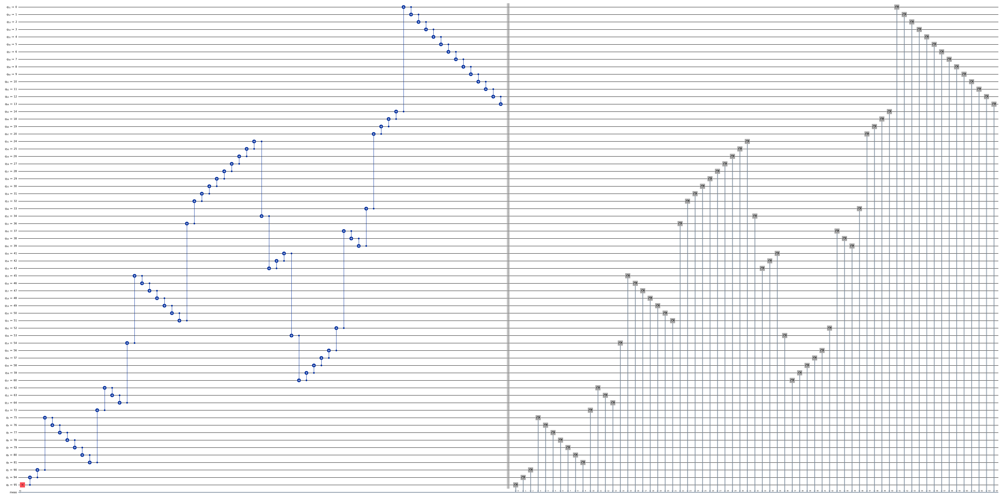

In [17]:
sabre_cir_custom.draw('mpl', idle_wires=False, fold=-1)

In [18]:
multilevel_cir.draw('mpl', fold=-1)

In [19]:
from qiskit.transpiler.passes import SabreLayout
from qiskit.converters import *

In [21]:
sabre_layout = SabreLayout(coupling_map = coupling_map, seed = 1, layout_trials=2500, skip_routing=False)

num_program_qubit=qc.num_qubits
num_classical_bits=qc.num_clbits
num_physical_qubit=max(max(i) for i in coupling_map)+1
temp_qc=QuantumCircuit(num_physical_qubit,num_classical_bits)
temp_qc.compose(qc,inplace=True)

qc=temp_qc
out_dag = sabre_layout.run(circuit_to_dag(qc))
sabre_cir = dag_to_circuit(out_dag)

count_swap = 0
for gate in sabre_cir.data:
    if gate[0].name == 'swap':
        count_swap += 1

count_swap

/var/folders/jt/44gl1rhd26v6ykt0frqzl87r0000gn/T/ipykernel_21445/282749999.py:15: DeprecationWarning: Treating CircuitInstruction as an iterable is deprecated legacy behavior since Qiskit 1.2, and will be removed in Qiskit 3.0. Instead, use the `operation`, `qubits` and `clbits` named attributes.
  if gate[0].name == 'swap':


14